<a href="https://colab.research.google.com/github/nawroz-m/ML_learning/blob/main/sky_eye_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# IMPORTANT: SOME KAGGLE DATA SOURCES ARE PRIVATE
# RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES.
import kagglehub
kagglehub.login()


In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

awsaf49_semantic_drone_dataset_path = kagglehub.dataset_download('awsaf49/semantic-drone-dataset')
nawrozmohammadi_best_model_pytorch_default_1_path = kagglehub.model_download('nawrozmohammadi/best-model/PyTorch/default/1')

print('Data source import complete.')


In [ ]:
# import packages
import os
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
import torchvision.transforms.functional as TF
from torchvision.transforms import InterpolationMode
from torchsummary import summary
import random
from torch.optim.lr_scheduler import CosineAnnealingLR
import pandas as pd
from torch.utils.tensorboard import SummaryWriter
import time

In [ ]:
# check if the gpu is available or not
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cpu'

In [ ]:
path = "/kaggle/input/datasets/awsaf49/semantic-drone-dataset/semantic_drone_dataset/training_set"

In [ ]:
# Check inside the dataset directory how many file and folders are there
for dirpath, dirnames, filenames in os.walk(os.path.join(path, 'images')):
    print(f'There are {len(filenames)} files and {len(dirnames)} directories in [{dirpath}]')
# Check inside the gt semantic
for dirpath, dirnames, filenames in os.walk(os.path.join(path, 'gt/semantic')):
    print(f'There are {len(filenames)} files and {len(dirnames)} directories in [{dirpath}]')

There are 400 files and 0 directories in [/kaggle/input/datasets/awsaf49/semantic-drone-dataset/semantic_drone_dataset/training_set/images]
There are 1 files and 2 directories in [/kaggle/input/datasets/awsaf49/semantic-drone-dataset/semantic_drone_dataset/training_set/gt/semantic]
There are 400 files and 0 directories in [/kaggle/input/datasets/awsaf49/semantic-drone-dataset/semantic_drone_dataset/training_set/gt/semantic/label_images]
There are 400 files and 0 directories in [/kaggle/input/datasets/awsaf49/semantic-drone-dataset/semantic_drone_dataset/training_set/gt/semantic/label_me_xml]


In [ ]:
# list all the images from the original_images directory later on we can use them
org_imgs = os.listdir(os.path.join(path, 'images'))
print(f'There are {len(org_imgs)} images in [original_images] directory')

There are 400 images in [original_images] directory


In [ ]:
# reading images and labels by index later
def get_img_label(idx):
  img_path = org_imgs[idx]
  img = Image.open(os.path.join(path, 'images', img_path))
  label = Image.open(os.path.join(path, 'gt/semantic/label_images', f'{img_path.split('.')[0]}.png'))
  return img, label

In [ ]:
img, mask = get_img_label(np.random.randint(400))
print(f'Image size is {img.size}')
np.array(img).shape, np.array(mask).shape

Image size is (6000, 4000)


((4000, 6000, 3), (4000, 6000, 3))

In [ ]:
def split_into_16(img, mask):
    """
    Split image and mask into a 4×4 grid (16 non-overlapping tiles).

    Grid layout:
        [ (0,0) | (1,0) | (2,0) | (3,0) ]
        [ (0,1) | (1,1) | (2,1) | (3,1) ]
        [ (0,2) | (1,2) | (2,2) | (3,2) ]
        [ (0,3) | (1,3) | (2,3) | (3,3) ]

    Benefits:
    - higher spatial detail
    - better small object detection
    - more training samples
    """

    w, h = img.size

    # vertical splits (4 columns)
    x1 = w // 4
    x2 = 2 * w // 4
    x3 = 3 * w // 4

    # horizontal splits (4 rows)
    y1 = h // 4
    y2 = 2 * h // 4
    y3 = 3 * h // 4

    crops = [
        # row 0
        (0,   0,  x1,  y1),
        (x1,  0,  x2,  y1),
        (x2,  0,  x3,  y1),
        (x3,  0,  w,   y1),

        # row 1
        (0,   y1, x1,  y2),
        (x1,  y1, x2,  y2),
        (x2,  y1, x3,  y2),
        (x3,  y1, w,   y2),

        # row 2
        (0,   y2, x1,  y3),
        (x1,  y2, x2,  y3),
        (x2,  y2, x3,  y3),
        (x3,  y2, w,   y3),

        # row 3
        (0,   y3, x1,  h),
        (x1,  y3, x2,  h),
        (x2,  y3, x3,  h),
        (x3,  y3, w,   h),
    ]

    return [(img.crop(c), mask.crop(c)) for c in crops]

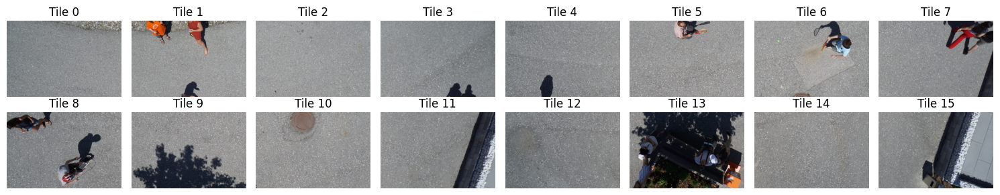

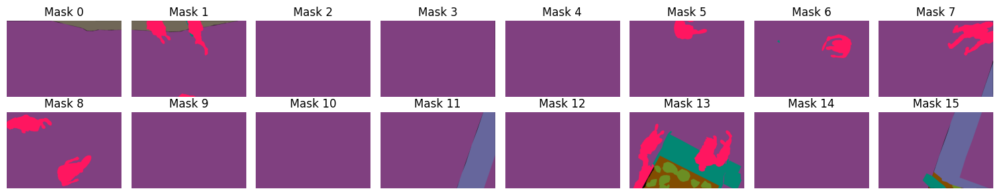

In [ ]:
tiles = split_into_16(img, mask)

fig, axes = plt.subplots(2, 8, figsize=(15, 3))

axes = axes.flatten()  # makes indexing easy

for idx, (img_tile, mask_tile) in enumerate(tiles):

    # image
    axes[idx].imshow(img_tile)
    axes[idx].set_title(f"Tile {idx}")
    axes[idx].axis("off")

plt.tight_layout()
plt.show()
# plot the masks
fig, axes = plt.subplots(2, 8, figsize=(15, 3))
axes = axes.flatten()

for idx, (img_tile, mask_tile) in enumerate(tiles):

    axes[idx].imshow(mask_tile, cmap="gray")
    axes[idx].set_title(f"Mask {idx}")
    axes[idx].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
for idx, (img_tile, mask_tile) in enumerate(tiles):
    print(np.array(img_tile).shape, np.array(mask_tile).shape)

In [ ]:
from concurrent.futures import ProcessPoolExecutor
from functools import partial

# Helper function to process a single image index
def process_single_image(i, org_imgs, path, img_dir, label_dir):
    img_path = org_imgs[i]
    img_full_path = os.path.join(path, "images", img_path)
    label_name = os.path.splitext(img_path)[0] + ".png"
    label_full_path = os.path.join(path, "gt/semantic/label_images", label_name)

    img = Image.open(img_full_path)
    label = Image.open(label_full_path)
    tiles = split_into_16(img, label)

    local_count = 0
    for j, (img_t, label_t) in enumerate(tiles):
        img_t.save(os.path.join(img_dir, f"img_{i}_{j}.png"))
        label_t.save(os.path.join(label_dir, f"mask_{i}_{j}.png"))
        local_count += 1
    return local_count

def save_dataset_tiles_fast(output_dir):
    start_time = time.time()
    img_dir = os.path.join(output_dir, "images")
    label_dir = os.path.join(output_dir, "labels")
    os.makedirs(img_dir, exist_ok=True)
    os.makedirs(label_dir, exist_ok=True)

    # Use a ProcessPoolExecutor to parallelize
    # Adjust max_workers based on your CPU cores
    with ProcessPoolExecutor() as executor:
        func = partial(process_single_image, org_imgs=org_imgs, path=path,
                       img_dir=img_dir, label_dir=label_dir)
        results = list(executor.map(func, range(len(org_imgs))))

    print(f"Saved {sum(results)} tiles")
    print(f"Time: {time.time() - start_time:.2f} sec")

In [ ]:
save_dataset_tiles_fast('/kaggle/working/dataset')

In [ ]:
# list all the images from the original_images directory later on we can use them
dataset_imgs = os.listdir(os.path.join("/kaggle/working/dataset", 'images'))
print(f'There are {len(dataset_imgs)} images in [dataset/images] directory')

There are 6400 images in [dataset/images] directory


In [ ]:
# split the dataset in training (70%), validation (15%), and tesing (15%)
generator = torch.Generator().manual_seed(0) # keep the randomnes constant for the development and testing
training_imgs, validation_imgs, testing_imgs = torch.utils.data.random_split(dataset_imgs, [0.7, 0.15, 0.15])
print(f'{len(training_imgs)} images for training \n{len(validation_imgs)} images for validation \n{len(testing_imgs)} images for testinng.')
print(f'Total number of images: {len(dataset_imgs)}')

4480 images for training 
960 images for validation 
960 images for testinng.
Total number of images: 6400


Get only 50% of the entire dataset

In [ ]:
import random
num_to_keep = int(len(dataset_imgs) * 0.5)
random.seed(0)
sampled_imgs = random.sample(dataset_imgs, num_to_keep)

# Get the indices for the split
train_len = int(len(sampled_imgs) * 0.7)
val_len = int(len(sampled_imgs) * 0.15)
test_len = len(sampled_imgs) - train_len - val_len

# Split the list of filenames
train_files, val_files, test_files = torch.utils.data.random_split(
    sampled_imgs, [train_len, val_len, test_len], generator=generator
)

# Crucial: extract the raw list of filenames from the subsets
training_imgs = list(train_files)
validation_imgs = list(val_files)
test_list = list(test_files)

In [ ]:
# ==== Uncoment this to calculate and find the correct class indices ====
# IMG_SIZE = 1024
# gl_mean = [0.4441, 0.4431, 0.4013]
# gl_std = [0.1898, 0.1837, 0.1954]
# class DummyClauss(torch.utils.data.Dataset):
#   def __init__(self, data_dir, img_list, transform=None):
#     self.data_dir = data_dir
#     self.img_list = img_list
#     self.transform = transform

#   def __len__(self):
#     return len(self.img_list)

#   def __getitem__(self, index):
#     img_idx = index
#     img_name = self.img_list[img_idx]

#     img = Image.open(os.path.join(self.data_dir, 'images', img_name)).convert("RGB")
#     mask = Image.open(os.path.join(self.data_dir, 'gt/semantic/label_images', f'{img_name.split('.')[0]}.png')).convert("L")

#     if self.transform:
#         img, mask = self.transform(img, mask)

#     return img, mask

# def simple_transformer(img, mask):
#     # Resize
#     img = TF.resize(img, (IMG_SIZE, IMG_SIZE))
#     mask = TF.resize(mask, (IMG_SIZE, IMG_SIZE), interpolation=InterpolationMode.NEAREST)
#     # Convert to tensor
#     img = TF.to_tensor(img)
#     # mask = TF.to_tensor(mask)
#     mask = torch.as_tensor(np.array(mask), dtype=torch.long)
#     # Normalize ONLY image
#     img = TF.normalize(
#         img,
#         mean=gl_mean,
#         std=gl_std
#     )
#     return img, mask
# simple_train_dataset = DummyClauss(path, training_imgs, simple_transformer)
# print(len(simple_train_dataset))


# all_labels = set()

# for _, masks in simple_train_dataset:
#     all_labels.update(torch.unique(masks).tolist())

# print(sorted(all_labels))
# print(f"The masks contain {len(all_labels)} label values")
# [0, 39, 42, 45, 46, 52, 60, 70, 83, 90, 93, 100, 104, 108, 119, 138, 153, 164, 211, 225]
# The masks contain 20 label values

In [ ]:
NUM_CLASSES = 20 # len(all_labels)
# Build a mapping from raw pixel values → class before training
all_labels = [0, 39, 42, 45, 46, 52, 60, 70, 83, 90, 93, 100, 104, 108, 119, 138, 153, 164, 211, 225]
label_map = {v: i for i, v in enumerate(sorted(all_labels))}

In [ ]:
# Create a class to load the dataset
class MyDataset(torch.utils.data.Dataset):
  def __init__(self, data_dir, img_list, transform=None):
    self.data_dir = data_dir
    self.img_list = img_list
    self.transform = transform

  def __len__(self):
    return len(self.img_list)

  def __getitem__(self, index):
    filename = self.img_list[index]
    img_idx, tile_idx = map(int, filename[4:-4].split("_"))
    mask_name = f"mask_{img_idx}_{tile_idx}.png"

    img = Image.open(os.path.join(self.data_dir, 'images', filename)).convert("RGB")
    mask = Image.open(os.path.join(self.data_dir, 'labels', mask_name)).convert("L")

    if self.transform:
        img, mask = self.transform(img, mask)

    return img, mask

In [ ]:
# Add some data augmentaion to the datasets
IMG_SIZE = 224
gl_mean = [0.4441, 0.4431, 0.4013]
gl_std = [0.1898, 0.1837, 0.1954]

MAX_VAL = 256
remap_lut = torch.zeros(MAX_VAL, dtype=torch.long)
for pixel_val, class_idx in label_map.items():
    remap_lut[int(pixel_val)] = class_idx

def remap_mask(mask: torch.Tensor) -> torch.Tensor:
    """Convert raw pixel values to contiguous class indices."""
    return remap_lut[mask]


def train_transform(img, mask):
    # Resize
    img = TF.resize(img, (IMG_SIZE, IMG_SIZE))
    mask = TF.resize(mask, (IMG_SIZE, IMG_SIZE), interpolation=InterpolationMode.NEAREST)
    # Random horizontal flip
    if random.random() > 0.5:
        img = TF.hflip(img)
        mask = TF.hflip(mask)
    # Random rotation
    angle = random.uniform(-10, 10)
    img = TF.rotate(img, angle)
    mask = TF.rotate(mask, angle, interpolation=InterpolationMode.NEAREST)
    # Convert to tensor
    img = TF.to_tensor(img)
    # mask = TF.to_tensor(mask)
    mask = torch.as_tensor(np.array(mask), dtype=torch.long)
    # Remap the mask
    mask = remap_mask(mask)

    # Normalize ONLY image
    img = TF.normalize(
        img,
        mean=gl_mean,
        std=gl_std
    )
    return img, mask

def test_transformer(img, mask):
    # Resize
    img = TF.resize(img, (IMG_SIZE, IMG_SIZE))
    mask = TF.resize(mask, (IMG_SIZE, IMG_SIZE), interpolation=InterpolationMode.NEAREST)
    # Convert to tensor
    img = TF.to_tensor(img)
    # mask = TF.to_tensor(mask)
    mask = torch.as_tensor(np.array(mask), dtype=torch.long)
    # Remap the mask
    mask = remap_mask(mask)
    # Normalize ONLY image
    img = TF.normalize(
        img,
        mean=gl_mean,
        std=gl_std
    )
    return img, mask

In [ ]:
# Load the trainin, validation and testing dataset
# This might take 12 minuts in the first attempt
train_data = MyDataset("/kaggle/working/dataset", training_imgs, train_transform)
val_data = MyDataset("/kaggle/working/dataset", validation_imgs, test_transformer)
test_data = MyDataset("/kaggle/working/dataset", testing_imgs, test_transformer)
len(train_data), len(val_data), len(test_data)

In [ ]:
img, mask = test_data.__getitem__(0)
img.shape, mask.shape

(torch.Size([3, 224, 224]), torch.Size([224, 224]))

In [ ]:
# Create a data loader for training, validation, and testing
batch_size = 16
train_dataloader = torch.utils.data.DataLoader(train_data,
                                               batch_size=batch_size,
                                               shuffle=True,
                                               num_workers=2,
                                               pin_memory=True, # speeds up the transfer of data from CPU to GPU
                                               drop_last=True)
val_dataloader = torch.utils.data.DataLoader(val_data,
                                               batch_size=batch_size,
                                               shuffle=False,
                                               num_workers=2,
                                               pin_memory=True,
                                               drop_last=False)

test_dataloader = torch.utils.data.DataLoader(test_data,
                                               batch_size=batch_size,
                                               shuffle=False,
                                               num_workers=2,
                                               pin_memory=False,
                                               drop_last=False)
print(f"""There are {len(train_dataloader)} training batches
{len(val_dataloader)} validation batches
{len(test_dataloader)} testing batches""")


There are 140 training batches
30 validation batches
60 testing batches


In [ ]:
# build the double conve
class DoubleConve_block(nn.Module):
  def __init__(self, in_c, out_c):
     super().__init__()
     self.double_conv = nn.Sequential(
         nn.Conv2d(in_c, out_c, 3, padding=1, stride=1),
         nn.BatchNorm2d(out_c),
         nn.ReLU(),
         nn.Conv2d(out_c, out_c, 3, padding=1, stride=1),
         nn.BatchNorm2d(out_c),
         nn.ReLU()
     )
  def forward(self, x):
    out = self.double_conv(x)
    return out

In [ ]:
# Create downsampling block
class Downsampling_block(nn.Module):
  def __init__(self, in_c, out_c):
     super().__init__()
     self.double_conv = DoubleConve_block(in_c, out_c)
     self.max = nn.MaxPool2d(2)
     self.dropout = nn.Dropout2d(0.3)

  def forward(self, x):
    f = self.double_conv(x)
    out = self.max(f)
    out = self.dropout(out)
    return f, out

In [ ]:
# Create upsampling block
class Upsampling_block(nn.Module):
  def __init__(self, in_c, out_c):
     super().__init__()
    #  upsample
     self.convt = nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2)
     self.drop = nn.Dropout(0.3)
     self.double_block = DoubleConve_block(out_c*2, out_c)
  def forward(self, x, skip):
    up = self.convt(x)
    # concatenate
    concat = torch.cat([up, skip], dim=1)
    # dropout
    out = self.drop(concat) # (out_c + out_c, out_c)
    # Conv2D twice with ReLU activation
    out = self.double_block(out)
    return out


In [ ]:
# Build the U-Net Model
class U_Net(nn.Module):
  def __init__(self):
    super(U_Net, self).__init__()
    # input
    # self.input = nn.Conv2d(3, 64, 3, padding=1) # (B, C, H, W)
    # Downsampling
    self.down1 = Downsampling_block(3, 64)
    self.down2 = Downsampling_block(64, 128)
    self.down3 = Downsampling_block(128, 256)
    self.down4 = Downsampling_block(256, 512)
    # Bottelneck
    self.bottleneck = DoubleConve_block(512, 1024)
    # Upsampling
    self.up6 = Upsampling_block(1024, 512)
    self.up7 = Upsampling_block(512, 256)
    self.up8 = Upsampling_block(256, 128)
    self.up9 = Upsampling_block(128, 64)
    self.output = nn.Conv2d(in_channels=64, out_channels=NUM_CLASSES, kernel_size=1)
  def forward(self, x):
    # x = self.input(x)
    # encoder: contracting path - downsample
    # 1 - downsample
    f1, p1 = self.down1(x)
    # 2 - downsample
    f2, p2 = self.down2(p1)
    # 3 - downsample
    f3, p3 = self.down3(p2)
    # 4 - downsample
    f4, p4 = self.down4(p3)

    # 5 - bottleneck
    bottleneck = self.bottleneck(p4)

    # decoder: expanding path - upsample
    # 6 - upsample
    u6 = self.up6(bottleneck, f4) # f4 is the skip connection
    # 7 - upsample
    u7 = self.up7(u6, f3)
    # 8 - upsample
    u8 = self.up8(u7, f2)
    # 9 - upsample
    u9 = self.up9(u8, f1)
    # outputs
    output = self.output(u9)
    return output

In [ ]:
u_net = U_Net().to(device)
summary(u_net, input_size=(3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
       BatchNorm2d-2         [-1, 64, 224, 224]             128
              ReLU-3         [-1, 64, 224, 224]               0
            Conv2d-4         [-1, 64, 224, 224]          36,928
       BatchNorm2d-5         [-1, 64, 224, 224]             128
              ReLU-6         [-1, 64, 224, 224]               0
 DoubleConve_block-7         [-1, 64, 224, 224]               0
         MaxPool2d-8         [-1, 64, 112, 112]               0
         Dropout2d-9         [-1, 64, 112, 112]               0
Downsampling_block-10  [[-1, 64, 224, 224], [-1, 64, 112, 112]]               0
           Conv2d-11        [-1, 128, 112, 112]          73,856
      BatchNorm2d-12        [-1, 128, 112, 112]             256
             ReLU-13        [-1, 128, 112, 112]               0
           Conv2d-14   

In [ ]:
# Setup the model compiler
EPOCHS = 80
optimizer = torch.optim.AdamW(u_net.parameters(), lr=1e-3, weight_decay=1e-4)

# per-epoch stepping
scheduler = CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-6)

In [ ]:
# Calculate frequencies
# This might take around 30 minutes depend on your system device
class_counts = torch.zeros(NUM_CLASSES)
for _, mask in train_dataloader:
    for c in range(NUM_CLASSES):
        class_counts[c] += (mask == c).sum()

class_freqs = class_counts / class_counts.sum()

# Calculate median frequency (only over classes that actually exist)
median_freq = torch.median(class_freqs[class_freqs > 0])

# Weight = median_freq / class_freq
# Use a larger eps for missing classes so they get weight ~1.0, not inf
class_weights = torch.where(
    class_counts > 0,
    median_freq / (class_freqs + 1e-6),   # normal classes
    torch.ones_like(class_freqs)            # missing classes → neutral weight 1.0
)

# Clamp and move to device
class_weights = torch.clamp(class_weights, max=10.0).to(device)

print(f"Weights shape: {class_weights.shape}")  # must be [20]
print(class_weights)

# Weights shape: torch.Size([20])
# tensor([ 0.5278,  3.2859,  3.0747,  0.9939,  9.7397,  1.0000,  0.1003,  0.2765,
#          0.6176,  0.0581,  0.6145,  2.4401,  0.2768,  0.8264,  0.3129, 10.0000,
#         10.0000,  2.1239,  3.9774,  1.5482], device='cuda:0')

In [ ]:
class DiceCELoss(nn.Module):
    def __init__(self, class_weights=None):
        super().__init__()
        self.ce = nn.CrossEntropyLoss(weight=class_weights)

    def forward(self, preds, targets):

        ce_loss = self.ce(preds, targets)

        preds = torch.softmax(preds, dim=1)

        targets_one_hot = torch.nn.functional.one_hot(
            targets,
            num_classes=preds.shape[1]
        ).permute(0, 3, 1, 2).float()

        intersection = (preds * targets_one_hot).sum()
        union = preds.sum() + targets_one_hot.sum()

        dice_loss = 1 - (2 * intersection + 1e-6) / (union + 1e-6)

        return ce_loss + dice_loss


loss_fun = DiceCELoss()

In [ ]:
def mean_iou(preds, targets, num_classes):
    ious = []

    preds = torch.argmax(preds, dim=1)

    for cls in range(num_classes):

        pred_cls = (preds == cls)
        target_cls = (targets == cls)

        intersection = (pred_cls & target_cls).sum().float()
        union = (pred_cls | target_cls).sum().float()

        if union == 0:
            continue

        ious.append(intersection / union)

    return torch.mean(torch.tensor(ious)).item()

In [ ]:
# Create a training method
def train_model(model, dataloader, loss_fun, optimizer):
  training_loss, total, correct = 0, 0, 0
  running_iou = 0
  model.train()
  for batch, (X, y) in enumerate(dataloader):
    X, y = X.to(device), y.to(device)
    y = y.squeeze(1).long()

    optimizer.zero_grad() # reset the gradient
    y_pred = model(X) # (B, C, H, W)
    loss = loss_fun(y_pred, y) # calculate the loss
    # IoU
    with torch.no_grad():
        batch_iou = mean_iou(y_pred, y, NUM_CLASSES)
        running_iou += batch_iou
    # Pixel level
    loss.backward() # comput the gradient
    optimizer.step() # update the weight
    training_loss += loss.item()
    # Calculate the training accuracy
    preds = torch.argmax(y_pred, dim=1)
    correct += (preds == y).sum().item()
    total += y.numel()
    # if batch == 2:
    #   break
    if (batch+1 == len(dataloader)):
      print(f'Batch {batch+1}/{len(dataloader)} | Loss: {loss.item():.4f}')
  training_acc = correct / total
  epoch_iou = running_iou / len(dataloader)
  return training_loss/len(dataloader), training_acc, epoch_iou


In [ ]:
# Create a validation method
def validate_model(model, dataloader, loss_fun, epoch):
  model.eval()
  val_loss, correct, total = 0, 0, 0
  running_iou = 0
  with torch.no_grad():
    for batch, (X, y) in enumerate(dataloader):
      X, y = X.to(device), y.to(device)
      y = y.squeeze(1).long()
      y_pred = model(X)
      loss = loss_fun(y_pred, y)
      # IoU
      batch_iou = mean_iou(y_pred, y, NUM_CLASSES)
      running_iou += batch_iou
      val_loss += loss.item()
      preds = torch.argmax(y_pred, dim=1)
      # accuracy in pixel level
      correct += (preds == y).sum().item()
      total += y.numel()
      # log the images for tensorboard
      if batch % 2 == 0:
        img = X[0].detach().cpu()
        mask = y[0].detach().cpu().unsqueeze(0)
        pred = y_pred[0].argmax(0).detach().cpu().unsqueeze(0)
      # if batch ==2:
      #   break

    val_acc = correct/total
    epoch_iou = running_iou / len(dataloader)
  return val_loss/len(dataloader), val_acc, epoch_iou

In [ ]:
history = {
    "train_loss": [],
    "train_acc": [],
    "val_loss": [],
    "val_acc": [],
    "val_iou": [],
    "train_iou": [],
    "time": []
}
best_val_loss = float('inf')
best_val_iou = 0
patience, epochs_no_improve = 10, 0
start_train_time = time.time()
for i in range(EPOCHS):
    print(f'Epoch {i+1}:')
    start_time = time.time()
    tr_loss, tr_acc, train_iou = train_model(u_net, train_dataloader, loss_fun, optimizer)
    history['train_acc'].append(tr_acc)
    history['train_loss'].append(tr_loss)
    history['train_iou'].append(train_iou)
    scheduler.step()

    val_loss, val_acc, val_iou = validate_model(u_net, val_dataloader, loss_fun, i+1)
    end_time = time.time()
    history['val_acc'].append(val_acc)
    history['val_loss'].append(val_loss)
    history['val_iou'].append(val_iou)
    history['time'].append((end_time - start_time)/60)

    print(f"""
    tr loss [{tr_loss:.4f}] | val loss [{val_loss:.4f}]
    tr acc [{tr_acc:.4f}] | val acc [{val_acc:.4f}] | lr [{optimizer.param_groups[-1]['lr']:.6f}]
    train iou [{train_iou:.4f}] | val iou [{val_iou:.4f}]
    time: {(end_time - start_time)/60:0.4f} minutes
    """)


    # Save only weights of the best model
    # if val_loss < best_val_loss:
    #     best_val_loss = val_loss
    if val_iou > best_val_iou:
        best_val_iou = val_iou
        epochs_no_improve = 0
        torch.save(u_net.state_dict(), '/kaggle/working/best_model_weights.pth')
        print("Best model saved!")
    else:
        epochs_no_improve += 1
        if epochs_no_improve >= patience:
            print(f"Early stopping at epoch {i+1}")
            break
end_train_time = time.time()
torch.save(u_net.state_dict(), '/kaggle/working/last_model.pth')
print(f'Last model saved correctly')
print(f'End training after {(end_train_time - start_train_time)/60} minutes')
writer.close()

Epoch 1:
Batch 140/140 | Loss: 1.9548

    tr loss [2.2331] | val loss [1.8624]
    tr acc [0.5720] | val acc [0.6137] | lr [0.001000]
    train iou [0.1372] | val iou [0.1426]
    time: 2.0769 minutes
    
Best model saved!
Epoch 2:
Batch 140/140 | Loss: 1.8691

    tr loss [1.7746] | val loss [1.7035]
    tr acc [0.6215] | val acc [0.6361] | lr [0.000998]
    train iou [0.1778] | val iou [0.1495]
    time: 2.1101 minutes
    
Best model saved!
Epoch 3:
Batch 140/140 | Loss: 1.6375

    tr loss [1.6430] | val loss [1.6274]
    tr acc [0.6479] | val acc [0.6500] | lr [0.000997]
    train iou [0.1899] | val iou [0.1624]
    time: 2.1100 minutes
    
Best model saved!
Epoch 4:
Batch 140/140 | Loss: 1.4155

    tr loss [1.5660] | val loss [1.5809]
    tr acc [0.6645] | val acc [0.6565] | lr [0.000994]
    train iou [0.2045] | val iou [0.1633]
    time: 2.1208 minutes
    
Best model saved!
Epoch 5:
Batch 140/140 | Loss: 2.0271

    tr loss [1.5664] | val loss [1.5257]
    tr acc [0.6629] 

<Axes: >

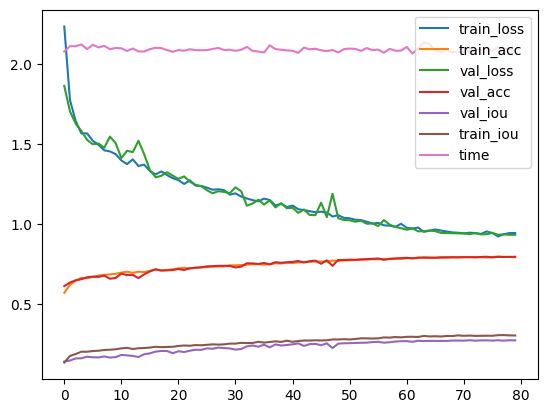

In [ ]:
pd.DataFrame(history).plot()

<Axes: >

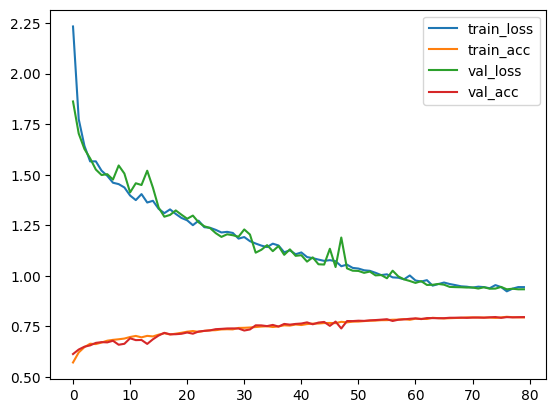

In [ ]:
pd.DataFrame({
    "train_loss": history['train_loss'],
    "train_acc": history['train_acc'],
    "val_loss": history['val_loss'],
    "val_acc": history['val_acc'],
}).plot()


<Axes: >

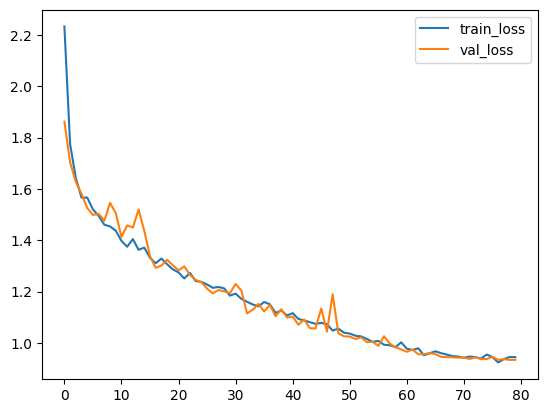

In [ ]:
pd.DataFrame({
    "train_loss": history['train_loss'],
    "val_loss": history['val_loss'],
}).plot()


<Axes: >

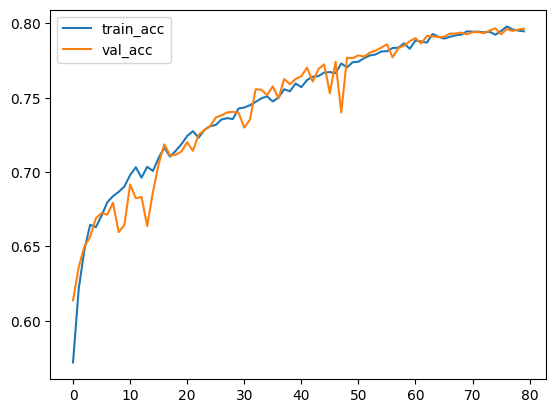

In [ ]:
pd.DataFrame({
    "train_acc": history['train_acc'],
    "val_acc": history['val_acc'],
}).plot()


<Axes: >

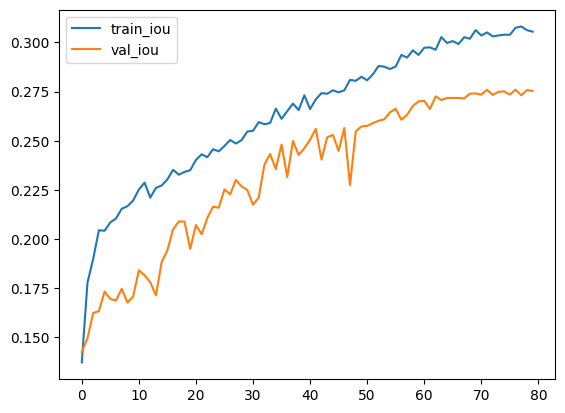

In [ ]:
pd.DataFrame({
    "train_iou": history['train_iou'],
    "val_iou": history['val_iou'],
}).plot()


In [ ]:
# let's test the model trained on 30 epochs on unseen data
# Create a validation method
def validate_model(model, dataloader, loss_fun):
  model.eval()
  val_loss, correct, total = 0, 0, 0
  running_iou = 0
  with torch.no_grad():
    for batch, (X, y) in enumerate(dataloader):
      X, y = X.to(device), y.to(device)
      y = y.squeeze(1).long()
      y_pred = model(X)
      # IoU
      batch_iou = mean_iou(y_pred, y, NUM_CLASSES)
      running_iou += batch_iou

      loss = loss_fun(y_pred, y)
      val_loss += loss.item()
      preds = torch.argmax(y_pred, dim=1)
      correct += (preds == y).sum().item()
      total += y.numel()
    val_acc = correct/total
    epoch_iou = running_iou / len(dataloader)
  return val_loss/len(dataloader), val_acc, epoch_iou

test_loss, test_acc, epoch_iou = validate_model(u_net, test_dataloader, loss_fun)
print(f'Testing loss: {test_loss:.4f} \t Testing accuracy: {test_acc:.4f} \t Testing IoU accuracy: {epoch_iou:.4f}')

Testing loss: 0.8550 	 Testing accuracy: 0.8137 	 Testing IoU accuracy: 0.2792


In [ ]:
# Denormalize method for displying normalized image
def denormalize(img, gl_mean=gl_mean, gl_std=gl_std):
    if isinstance(img, torch.Tensor):
        mean = torch.tensor(gl_mean, device=img.device)
        std = torch.tensor(gl_std, device=img.device)
        return img * std[:, None, None] + mean[:, None, None]

    elif isinstance(img, np.ndarray):
        mean = np.array(gl_mean)
        std = np.array(gl_std)
        return img * std[None, None, :] + mean[None, None, :]

In [ ]:
def plot_test_data():
    for i in range(2):
      rand_idx = np.random.randint(0, len(test_dataloader.dataset)+1)
      img, mask = test_dataloader.dataset.__getitem__(rand_idx) # fetach the image and ground truth mask
      img = img.unsqueeze(0).to(device)
      with torch.no_grad():
        y_pred = u_net(img) # predict

      fig, ax = plt.subplots(1, 3, figsize=(12, 5))
      ax[0].imshow(
          denormalize(img.squeeze(0))
          .permute(1, 2, 0)
          .cpu())
      ax[0].set_title(f"Image {rand_idx}")
      ax[0].axis(False)

      ax[1].imshow(mask)
      ax[1].set_title(f"Ground truth {rand_idx}")
      ax[1].axis(False)


      pred_mask = torch.argmax(y_pred, dim=1)
      ax[2].imshow(pred_mask.squeeze().cpu())
      ax[2].set_title(f"Predicted mask {rand_idx}")
      ax[2].axis(False)

      plt.tight_layout()

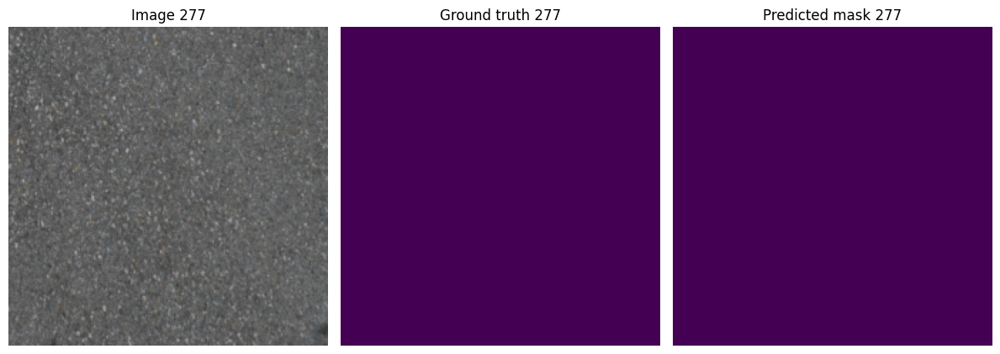

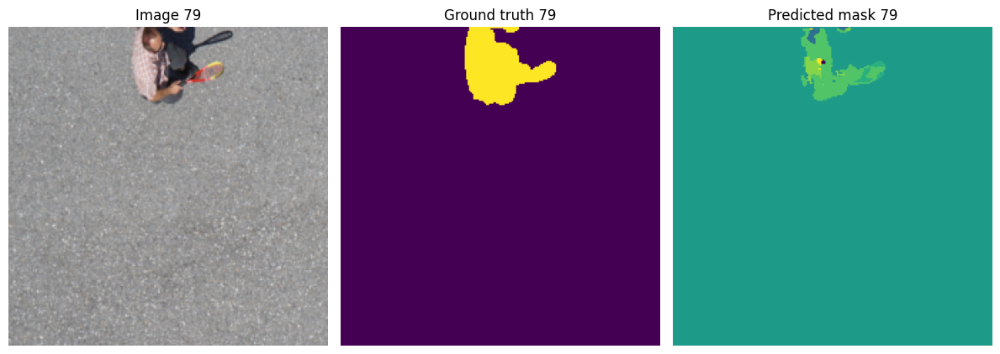

In [ ]:
plot_test_data()

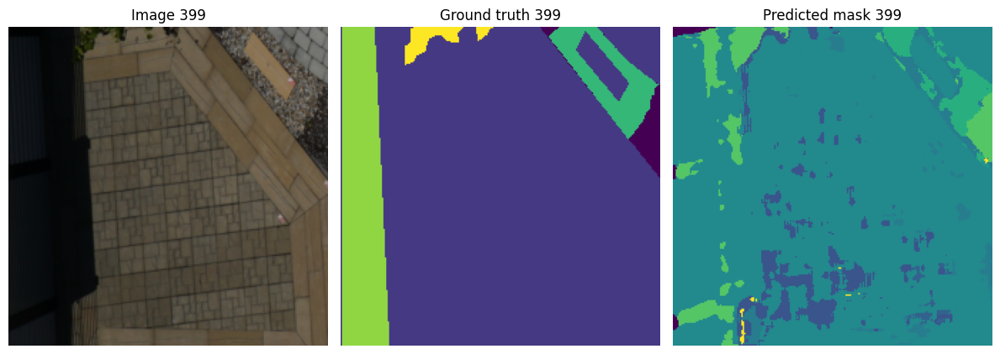

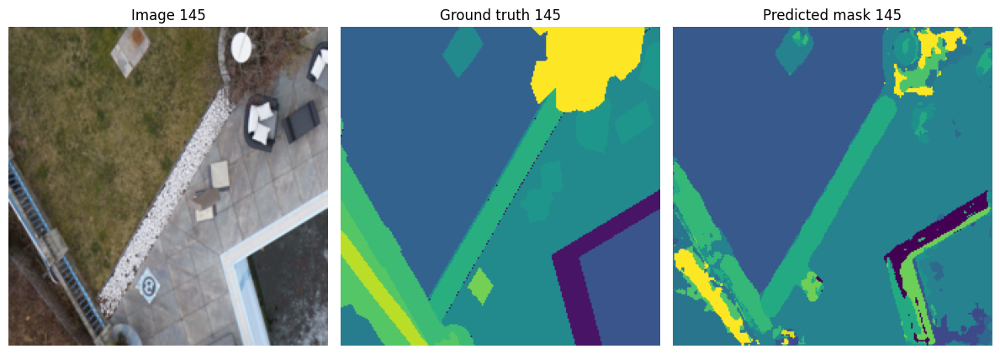

In [ ]:
plot_test_data()

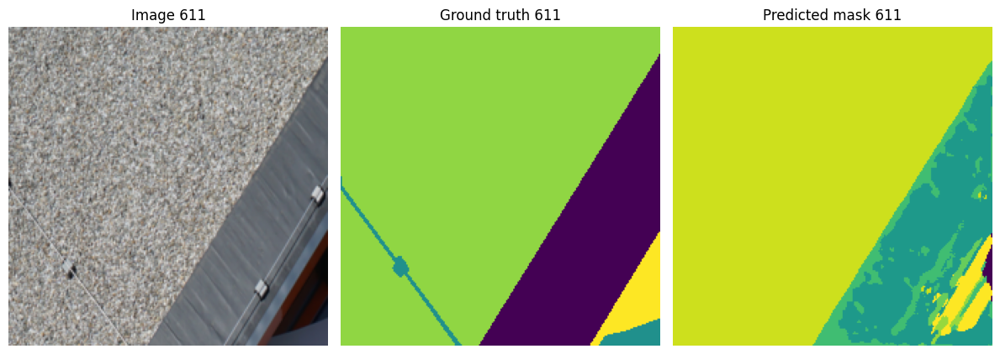

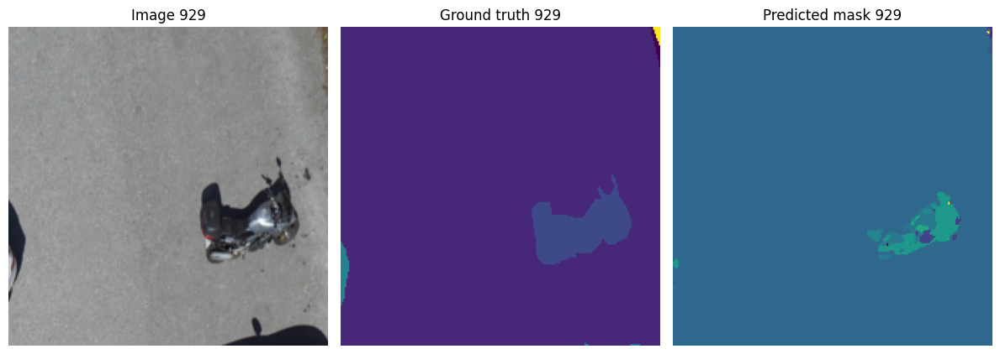

In [ ]:
plot_test_data()

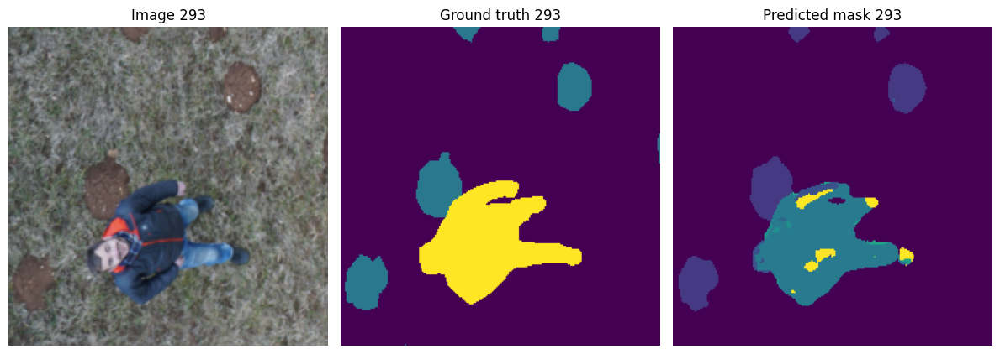

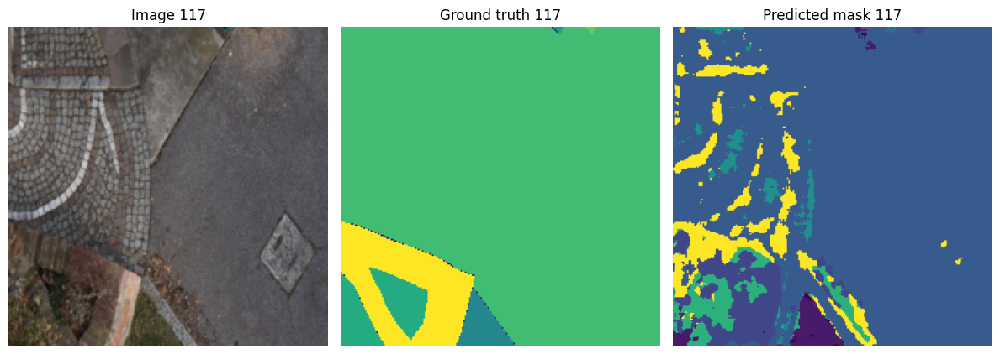

In [ ]:
plot_test_data()

In [ ]:
# Evaluate on best model
loaded_b_model = U_Net().to(device)
loaded_b_model.load_state_dict(torch.load('/kaggle/working/best_model_weights.pth'))
loaded_b_model.eval()

In [ ]:
# Add some data augmentaion to the datasets
IMG_SIZE = 224
gl_mean = [0.4441, 0.4431, 0.4013]
gl_std = [0.1898, 0.1837, 0.1954]


def test_transformer(img, mask):
    # Resize
    img = TF.resize(img, (IMG_SIZE, IMG_SIZE))
    mask = TF.resize(mask, (IMG_SIZE, IMG_SIZE), interpolation=InterpolationMode.NEAREST)
    # Convert to tensor
    img = TF.to_tensor(img)
    # mask = TF.to_tensor(mask)
    mask = torch.as_tensor(np.array(mask), dtype=torch.long)

    # Normalize ONLY image
    img = TF.normalize(
        img,
        mean=gl_mean,
        std=gl_std
    )
    return img, mask


In [ ]:
def plot_a_full_image_pred():
    for i in range(2):
      rand_idx = np.random.randint(400)
      img, mask = get_img_label(rand_idx)
      with torch.no_grad():
        X, y = test_transformer(img, mask)
        X = X.unsqueeze(0).to(device)
        y_pred = u_net(X) # predict

      fig, ax = plt.subplots(1, 3, figsize=(12, 5))
      ax[0].imshow(
          denormalize(X.squeeze(0))
          .permute(1, 2, 0)
          .cpu())
      ax[0].set_title(f"Image {rand_idx}")
      ax[0].axis(False)

      ax[1].imshow(y.cpu().numpy(), cmap="tab20")
      ax[1].set_title(f"Ground truth {rand_idx}")
      ax[1].axis(False)


      pred_mask = torch.argmax(y_pred, dim=1)
      ax[2].imshow(pred_mask.squeeze().cpu())
      ax[2].set_title(f"Predicted mask {rand_idx}")
      ax[2].axis(False)

      plt.tight_layout()

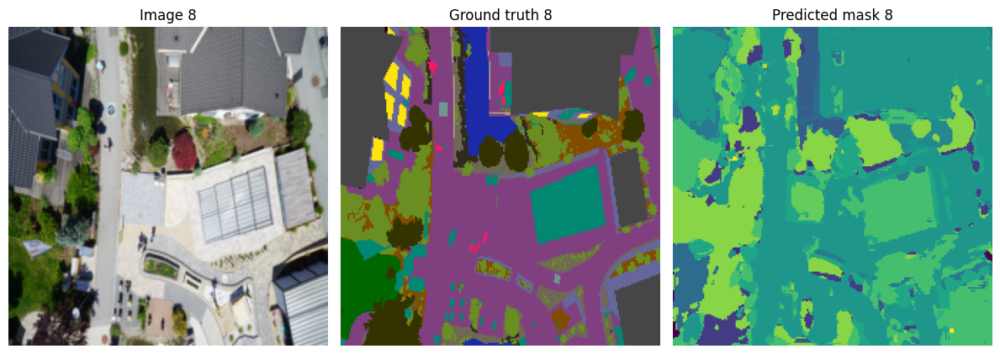

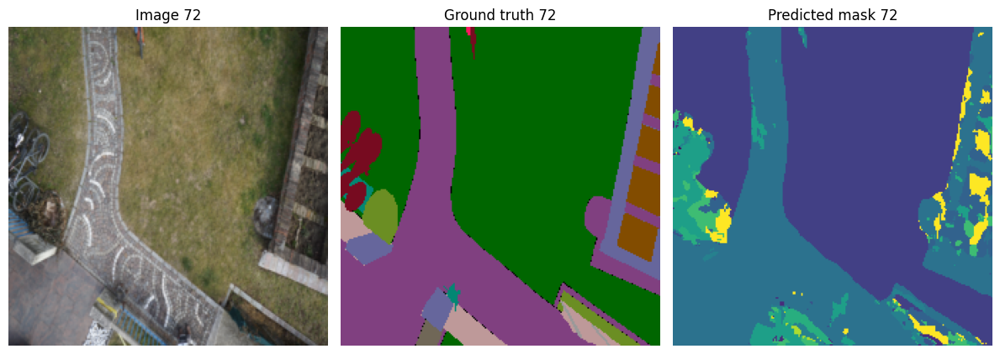

In [ ]:
plot_a_full_image_pred()

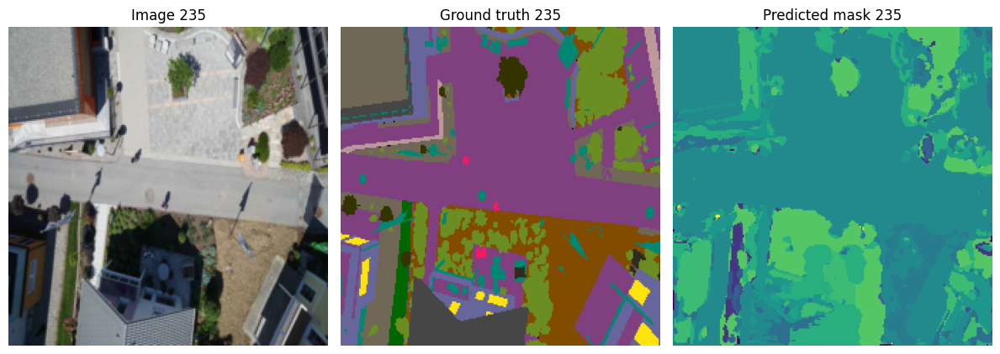

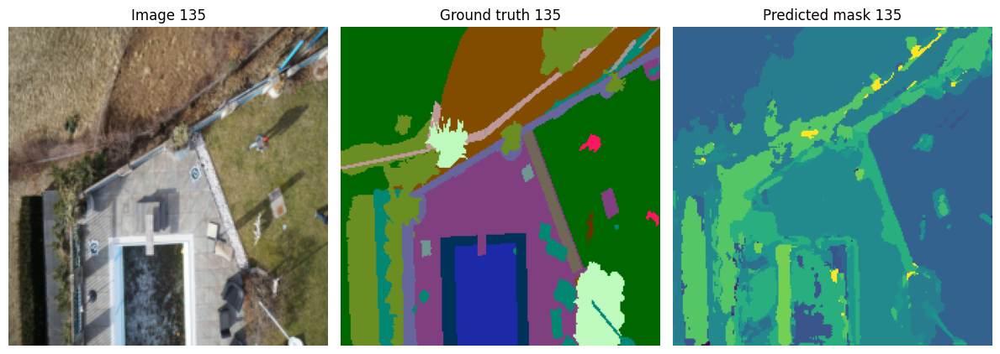

In [ ]:
plot_a_full_image_pred()

In [ ]:
# Evaluate on best model
loaded_b_model = U_Net().to(device)
loaded_b_model.load_state_dict(torch.load('/kaggle/input/models/nawrozmohammadi/best-model/pytorch/default/1/best_model_weights.pth',
                                         map_location=torch.device(device)))
loaded_b_model.eval()

U_Net(
  (down1): Downsampling_block(
    (double_conv): DoubleConve_block(
      (double_conv): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU()
      )
    )
    (max): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (dropout): Dropout2d(p=0.3, inplace=False)
  )
  (down2): Downsampling_block(
    (double_conv): DoubleConve_block(
      (double_conv): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 

In [ ]:
def get_img_label(idx):

  img_path = org_imgs[idx]
  img = Image.open(os.path.join(path, 'images', img_path))
  label = Image.open(os.path.join(path, 'gt/semantic/label_images', f'{img_path.split('.')[0]}.png'))
  return img, label

In [ ]:
import matplotlib.patches as patches
from scipy.ndimage import label

SAFE_CLASSES = [1, 2, 3, 4]
class_names = {
    0: "unlabeled", 1: "paved-area", 2: "dirt", 3: "grass", 4: "gravel",
    5: "water", 6: "rocks", 7: "pool", 8: "vegetation", 9: "roof",
    10: "wall", 11: "window", 12: "door", 13: "fence", 14: "fence-pole",
    15: "person", 16: "dog", 17: "car", 18: "bicycle", 19: "tree"
}

def get_safe_landing_zone(img, model, device, test_transformer, denormalize, class_names):

    with torch.no_grad():
        X, _ = test_transformer(img, img)
        X = X.unsqueeze(0).to(device)

        y_pred = model(X)
        pred_mask = torch.argmax(y_pred, dim=1).squeeze().cpu().numpy()

    img_vis = denormalize(X.squeeze(0)).permute(1, 2, 0).cpu().numpy()

    # build safe mask
    safe_mask = np.isin(pred_mask, SAFE_CLASSES).astype(np.uint8)

    # connected components
    labeled, num = label(safe_mask)

    best_label = None
    best_size = 0

    for i in range(1, num + 1):
        region = (labeled == i)
        region_classes = np.unique(pred_mask[region])

        # STRICT RULE: ONLY SAFE CLASSES ALLOWED
        if np.all(np.isin(region_classes, SAFE_CLASSES)):
            size = region.sum()
            if size > best_size:
                best_size = size
                best_label = i

    # NO VALID SAFE REGION
    if best_label is None:
        fig, ax = plt.subplots(1, 1, figsize=(6, 6))
        ax.imshow(img_vis)
        ax.set_title("No Safe Landing Zone Found")
        ax.axis("off")
        plt.show()
        return None

    # bounding box
    component_mask = (labeled == best_label)  # exact component pixels
    coords = np.column_stack(np.where(component_mask))
    y_min, x_min = coords.min(axis=0)
    y_max, x_max = coords.max(axis=0)

    pad = 10
    h, w = pred_mask.shape

    y_min = max(0, y_min - pad)
    x_min = max(0, x_min - pad)
    y_max = min(h, y_max + pad)
    x_max = min(w, x_max + pad)

    # confidence (safe density within padded bbox)
    region_safe = safe_mask[y_min:y_max, x_min:x_max]
    confidence = region_safe.sum() / region_safe.size

    # dominant class: only from exact component pixels, NOT the padded bbox
    safe_pixel_classes = pred_mask[component_mask]
    unique, counts = np.unique(safe_pixel_classes, return_counts=True)
    dominant_class = unique[np.argmax(counts)]
    class_name = class_names[int(dominant_class)]

    # plot
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))

    ax[0].imshow(img_vis)
    ax[0].set_title("Image")
    ax[0].axis("off")

    ax[1].imshow(pred_mask, cmap="tab20")
    ax[1].set_title("Prediction")
    ax[1].axis("off")

    ax[2].imshow(img_vis)
    # highlight all safe pixels
    safe_overlay = np.ma.masked_where(~safe_mask.astype(bool), safe_mask)
    ax[2].imshow(safe_overlay, cmap="hot_r", alpha=0.4)

    rect = patches.Rectangle(
        (x_min, y_min),
        x_max - x_min,
        y_max - y_min,
        linewidth=2,
        edgecolor="red",
        facecolor="none"
    )

    ax[2].add_patch(rect)
    ax[2].text(
        x_min,
        y_min - 5,
        f"{class_name}",
        color="red",
        fontsize=10,
        bbox=dict(facecolor="white", alpha=0.7)
    )

    ax[2].set_title(f"SAFE ZONE | Conf: {confidence:.2f}")
    ax[2].axis("off")

    plt.tight_layout()
    plt.show()

    return {
        "bbox": (x_min, y_min, x_max, y_max),
        "class": class_name,
        "confidence": confidence
    }

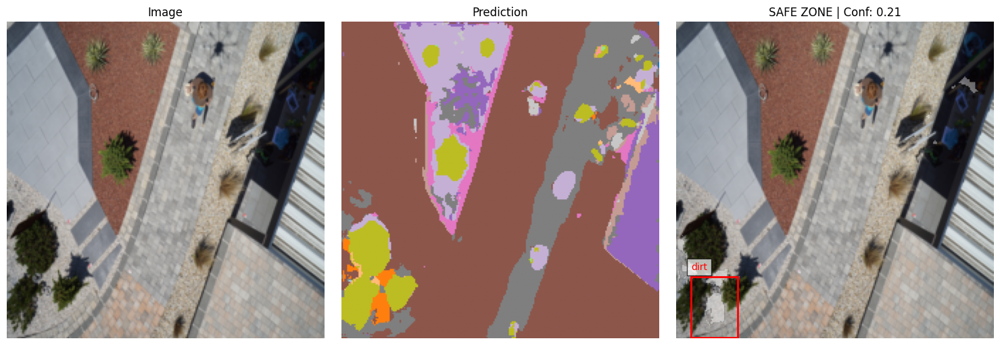

{'bbox': (np.int64(10), np.int64(180), np.int64(43), np.int64(223)),
 'class': 'dirt',
 'confidence': np.float64(0.21212121212121213)}

In [ ]:
img, _ = get_img_label(np.random.randint(400))

result = get_safe_landing_zone(
    img,
    loaded_b_model,
    device,
    test_transformer,
    denormalize,
    class_names
)
result

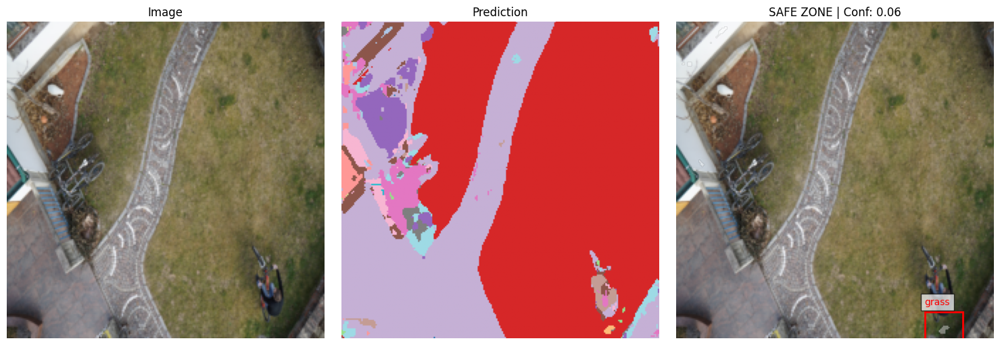

{'bbox': (np.int64(175), np.int64(205), np.int64(202), 224),
 'class': 'grass',
 'confidence': np.float64(0.05847953216374269)}

In [ ]:
img, _ = get_img_label(np.random.randint(400))

result = get_safe_landing_zone(
    img,
    loaded_b_model,
    device,
    test_transformer,
    denormalize,
    class_names
)
result

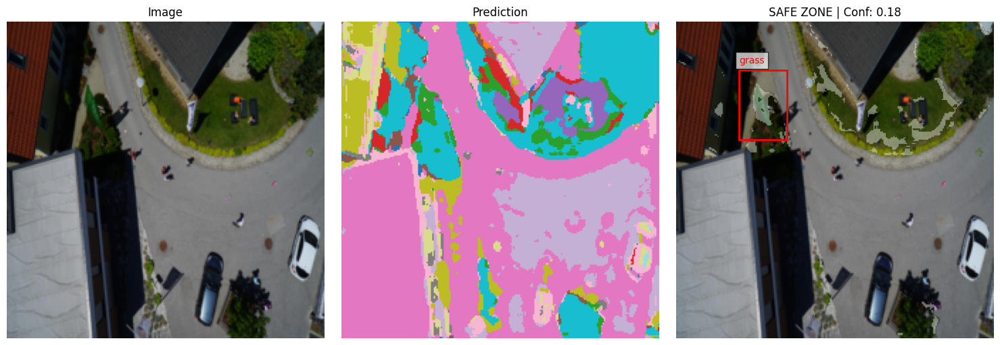

{'bbox': (np.int64(44), np.int64(34), np.int64(78), np.int64(83)),
 'class': 'grass',
 'confidence': np.float64(0.1794717887154862)}

In [ ]:
img, _ = get_img_label(np.random.randint(400))

result = get_safe_landing_zone(
    img,
    loaded_b_model,
    device,
    test_transformer,
    denormalize,
    class_names
)
result

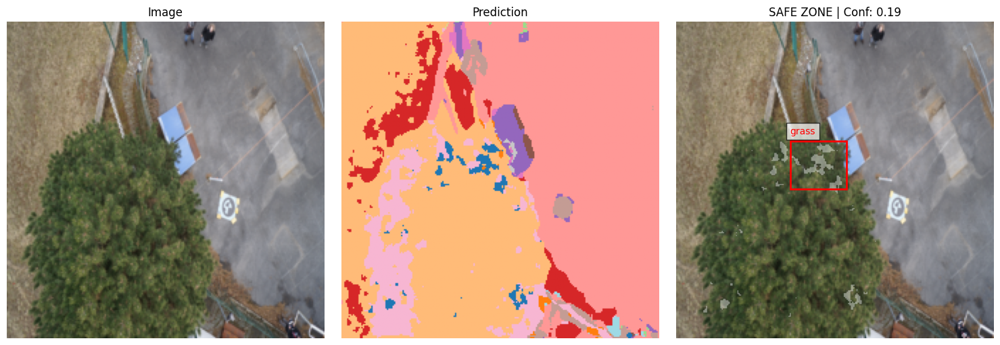

{'bbox': (np.int64(80), np.int64(84), np.int64(120), np.int64(118)),
 'class': 'grass',
 'confidence': np.float64(0.1948529411764706)}

In [ ]:
img, _ = get_img_label(np.random.randint(400))

result = get_safe_landing_zone(
    img,
    loaded_b_model,
    device,
    test_transformer,
    denormalize,
    class_names
)
result

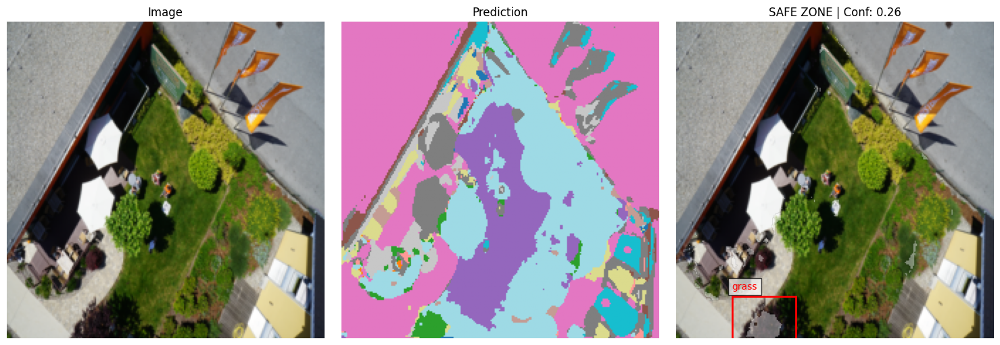

{'bbox': (np.int64(39), np.int64(194), np.int64(84), 224),
 'class': 'grass',
 'confidence': np.float64(0.2577777777777778)}

In [ ]:
img, _ = get_img_label(np.random.randint(400))

result = get_safe_landing_zone(
    img,
    loaded_b_model,
    device,
    test_transformer,
    denormalize,
    class_names
)
result

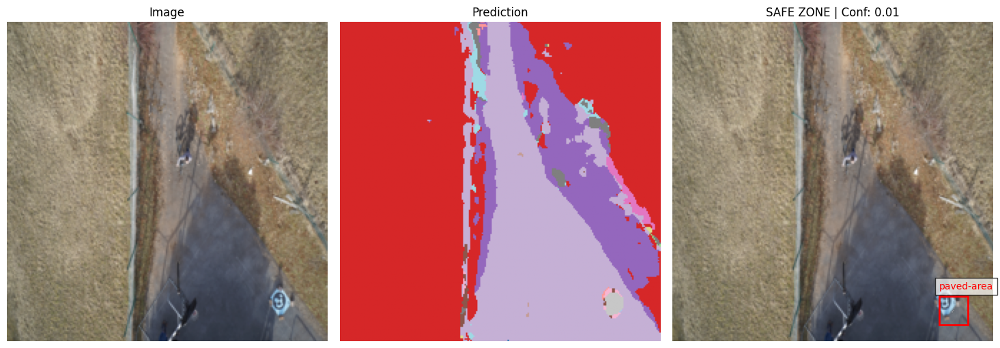

{'bbox': (np.int64(186), np.int64(192), np.int64(206), np.int64(212)),
 'class': 'paved-area',
 'confidence': np.float64(0.005)}

In [ ]:
img, _ = get_img_label(np.random.randint(400))

result = get_safe_landing_zone(
    img,
    loaded_b_model,
    device,
    test_transformer,
    denormalize,
    class_names
)
result

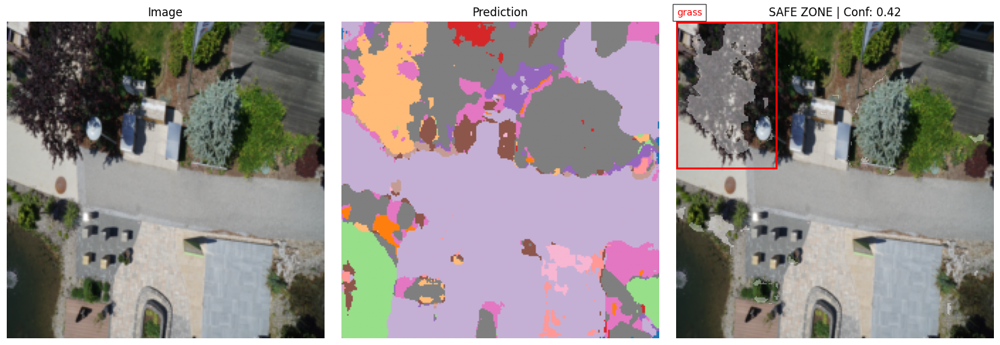

{'bbox': (0, 0, np.int64(70), np.int64(103)),
 'class': 'grass',
 'confidence': np.float64(0.4171983356449376)}

In [ ]:
img, _ = get_img_label(np.random.randint(400))

result = get_safe_landing_zone(
    img,
    loaded_b_model,
    device,
    test_transformer,
    denormalize,
    class_names
)
result